In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

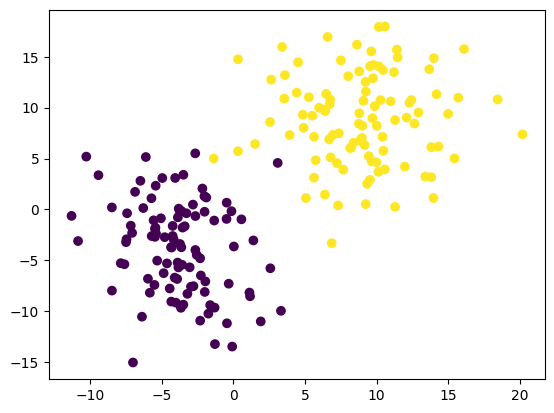

In [2]:
# Generate random data
np.random.seed(124)
X0 = np.random.multivariate_normal([-4,-4], [[10,0], [0,20]], size=100)
y0 = np.zeros(len(X0))
X1 = np.random.multivariate_normal([9,9], [[15,0], [0,20]], size=100)
y1 = np.ones(len(X1))
X = np.concatenate((X0, X1), axis=0)
y = np.concatenate((y0, y1), axis=0)
plt.scatter(X[:, 0], X[:, 1], c=y);

In [3]:
# weights and biases
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
w = torch.zeros((X.shape[1]), device=device)
b = torch.zeros(1, device=device)

# Shuffle the data
np.random.seed(123)
idxs = np.arange(0, len(X), 1)
np.random.shuffle(idxs)
X = X[idxs]
y = y[idxs]

# Normalize the features to zero mean and unit variance
X = (X - X.mean(axis=0)) / (X.std(axis=0) + 1e-9)

In [4]:
# Convert the dataset to pytorch tensor
X = torch.tensor(X, dtype=torch.float32, device=device)
y = torch.tensor(y, dtype=torch.float32, device=device)

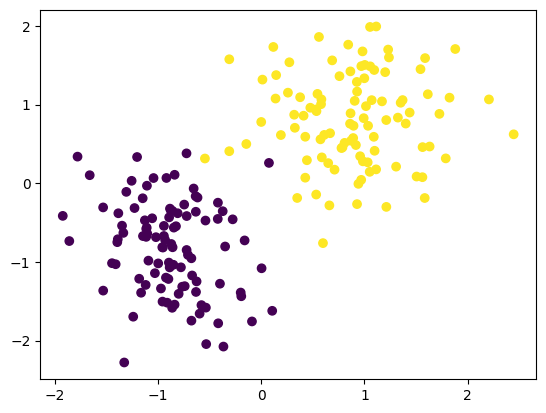

In [5]:
# Plot the normalized data
plt.scatter(X[:, 0], X[:, 1], c=y);

In [6]:
# Split the data between train and test set
n = int(0.7 * len(X))
X_train, y_train = X[:n], y[:n]
X_test, y_test = X[n:], y[n:]
print(f"Train dataset size is {X_train.shape}")
print(f"Test dataset size is {X_test.shape}")

Train dataset size is torch.Size([140, 2])
Test dataset size is torch.Size([60, 2])


In [7]:
def eval(X, y, w, b):
    y_pred = X @ w + b
    y_pred = torch.where(y_pred > 0, 1.0, 0.0)
    # accuracy
    acc = torch.sum(y_pred == y) / len(y) * 100.0
    #print(f"Correct preds={torch.sum(y_pred == y)}")
    #print(f"Accuracy of the model is {acc:.2f}%")
    return acc, y_pred

In [8]:
# Training
n_epochs = 2
all_weights = [] # save the weights at each iter for animation later
all_biases = [] # save the biases at each iter for animation later
for epoch in range(n_epochs):
    avg_err = 0.0
    for i in range(X_train.shape[0]):
        all_weights.append(w)
        all_biases.append(b)
        
        pred = X_train[i].dot(w) + b
        pred = torch.where(pred > 0, 1.0, 0.0)
        err = y_train[i] - pred
        w = w + err * X_train[i]
        b += err
        avg_err += err
        
        acc, _ = eval(X_train, y_train, w, b)
        #print(err[0], w)
        if acc == 100.0:
            break

    if acc == 100.0:
        all_weights.append(w)
        all_biases.append(b)
        break
    print(f"Epoch: {epoch}, avg_error: {avg_err/X_train.shape[0]}, train_acc: {acc:.2f}%")

Epoch: 0, avg_error: tensor([0.0071]), train_acc: 98.57%
Epoch: 1, avg_error: tensor([-0.0071]), train_acc: 97.86%


In [9]:
# Model weight params
print(f"Weights: {w}")
print(f"Bias: {b}")

Weights: tensor([1.8438, 1.6066])
Bias: tensor([0.])


In [10]:
# Evaluation
acc_train, y_pred_train = eval(X_train, y_train, w, b)
acc_test, y_pred_test = eval(X_test, y_test, w, b)
print(f"Train set accuracy is : {acc_train:.2f}%")
print(f"Test set accuracy is : {acc_test:.2f}%")

Train set accuracy is : 97.86%
Test set accuracy is : 100.00%


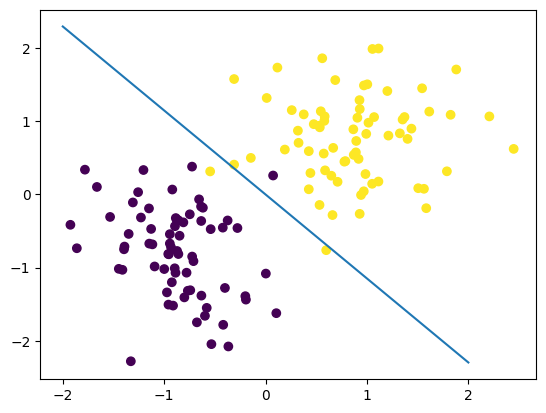

In [11]:
# Plot predictions on train dataset
plt.scatter(X_train[:, 0], X_train[:, 1], c=y_train)
# Draw the decision boundary
# x0*w0 + x1*w1 + b = 0 is the decision boundary
x0_min = -2
x0_max = 2
x1_min = (-(x0_min * w[0]) - b[0]) / w[1]
x1_max = (-(x0_max * w[0]) - b[0]) / w[1]
plt.plot([x0_min, x0_max], [x1_min, x1_max])

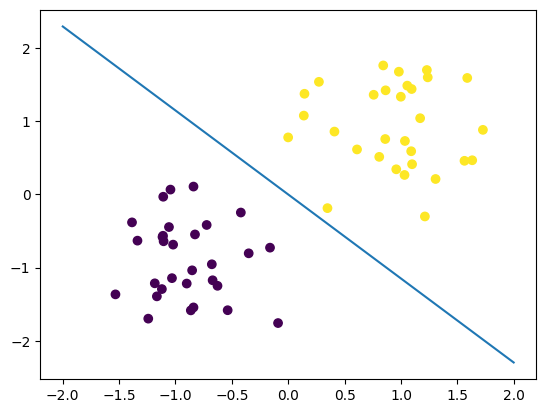

In [12]:
# Plot predictions on test dataset
plt.scatter(X_test[:, 0], X_test[:, 1], c=y_test)
# Draw the decision boundary
# x0*w0 + x1*w1 + b = 0 is the decision boundary
x0_min = -2
x0_max = 2
x1_min = (-(x0_min * w[0]) - b[0]) / w[1]
x1_max = (-(x0_max * w[0]) - b[0]) / w[1]
plt.plot([x0_min, x0_max], [x1_min, x1_max])

## Generate the animation

In [13]:
import imageio

scatter_dot_highlight_config = {'c': 'b',
                              'edgecolor': 'k',
                              'alpha': 0.0,
                              'linewidths': 2,
                              'marker': 'o',
                              's': 150}

def plot(i):
    fig, ax = plt.subplots()
    w, b = all_weights[i], all_biases[i]
    
    # Draw the decision boundary
    # x0*w0 + x1*w1 + b = 0 is the decision boundary
    x0_min = -2
    x0_max = 2
    x1_min = (-(x0_min * w[0]) - b[0]) / w[1]
    x1_max = (-(x0_max * w[0]) - b[0]) / w[1]
    
    ax.set_xlim([x0_min, x0_max])
    ax.set_ylim([x1_min, x1_max])
    ax.set_xlabel(f"iteration {i}")
    
    ax.plot([x0_min, x0_max], [x1_min, x1_max])
    # Plot predictions on train dataset
    ax.scatter(X_train[:, 0], X_train[:, 1], c=y_train)
    
    j=i%len(X_train)
    ax.scatter(X_train[j][0], X_train[j][1], **scatter_dot_highlight_config)
    
    fig.canvas.draw()
    image = np.frombuffer(fig.canvas.tostring_rgb(), dtype='uint8')
    image = image.reshape(fig.canvas.get_width_height()[::-1] + (3,))

    return image

/var/folders/mp/gz3gkp9133g5t7sqvx8bq3tc0000gn/T/ipykernel_37086/1621462263.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots()


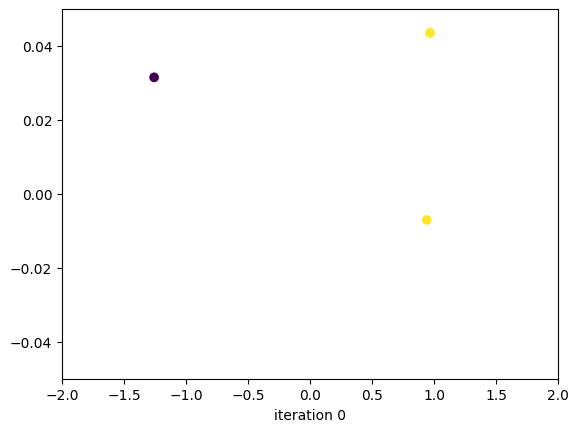

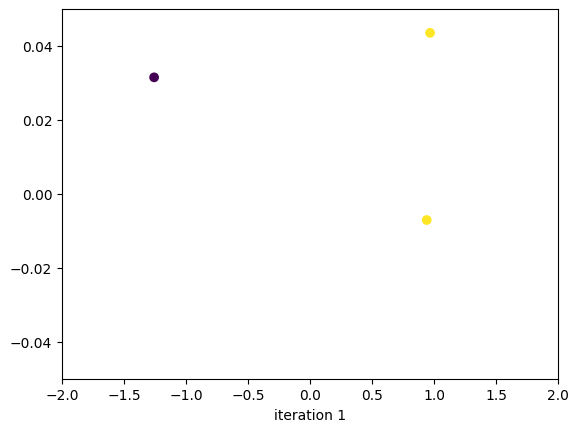

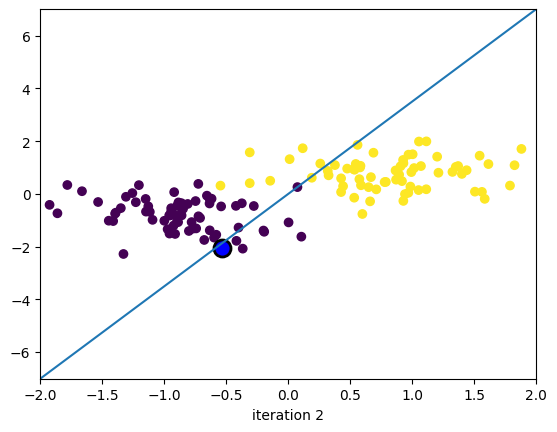

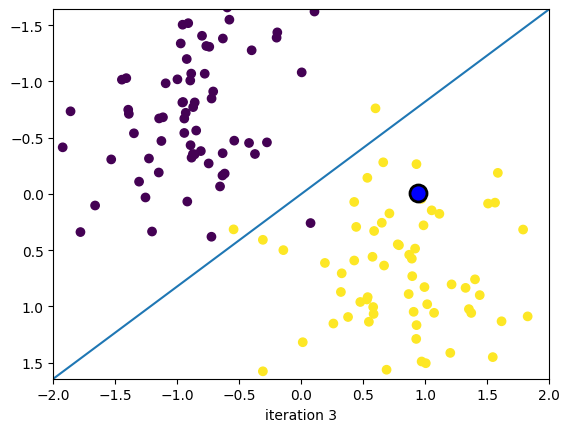

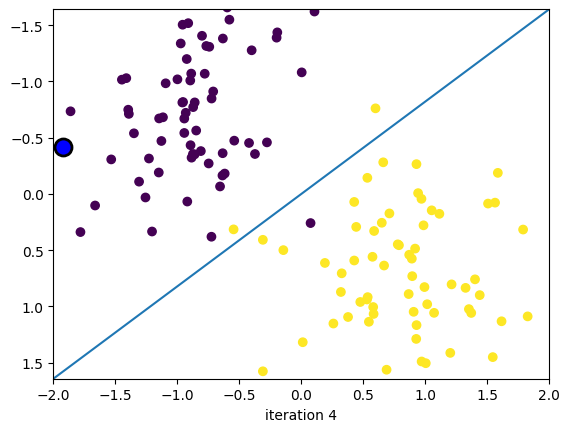

...

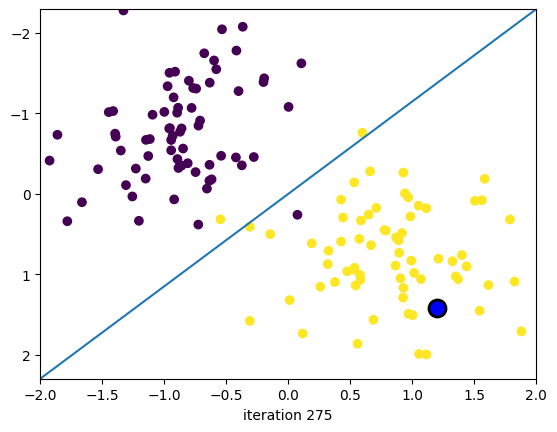

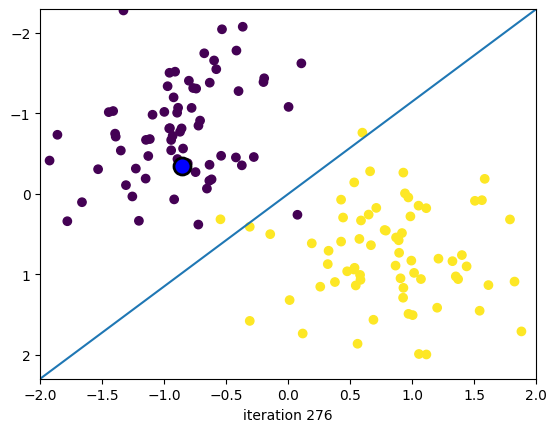

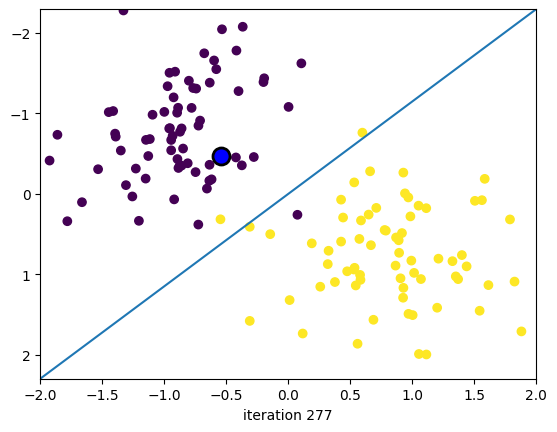

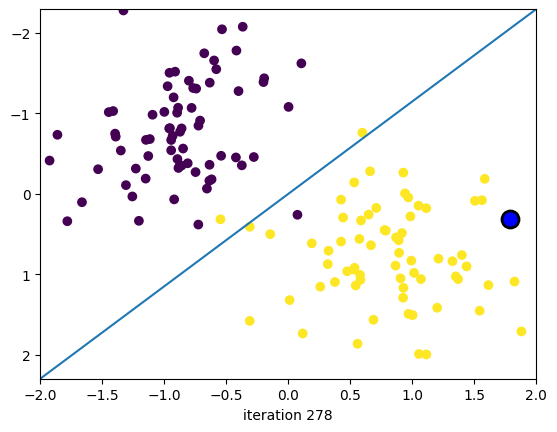

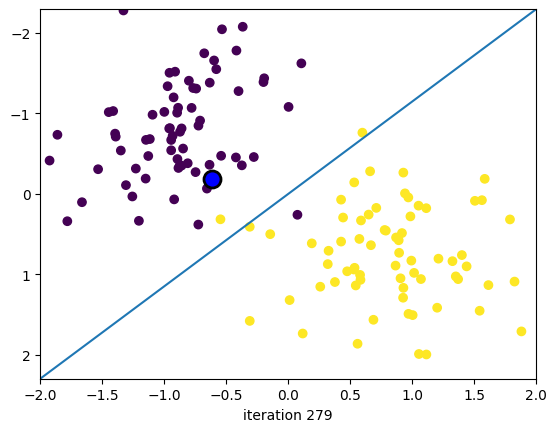

In [14]:
#kwargs_write = {'fps':1.0, 'quantizer':'nq'}
imageio.mimsave('training.gif', [plot(i) for i in range(len(all_weights))], fps=1);